<a href="https://colab.research.google.com/github/difasapi/project/blob/main/Vege_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [102]:
# Common
import os 
import keras
import numpy as np 
import tensorflow as tf
import random

# Data 
from keras.preprocessing.image import ImageDataGenerator

# Data Visualization
import plotly.express as px
import matplotlib.pyplot as plt
from PIL import Image

# Callbacaks
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Model 
from tensorflow import keras
from keras.models import Sequential, load_model
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout
from tensorflow.keras import layers

In [2]:
!pip install -q kaggle
from google.colab import files

In [3]:
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"difafarhanihakim","key":"3d44a4b5b0da283fd36cc50bd761b3eb"}'}

In [4]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets list

ref                                                             title                                       size  lastUpdated          downloadCount  voteCount  usabilityRating  
--------------------------------------------------------------  -----------------------------------------  -----  -------------------  -------------  ---------  ---------------  
akshaydattatraykhare/diabetes-dataset                           Diabetes Dataset                             9KB  2022-10-06 08:55:25          14329        433  1.0              
swaptr/layoffs-2022                                             Layoffs 2022                                29KB  2022-11-16 20:46:46            756         27  1.0              
akshaydattatraykhare/data-for-admission-in-the-university       Data for Admission in the University         4KB  2022-10-27 11:05:45           3245         71  1.0              
aneesayoub/world-universities-ranking-2022                      World Universities Ranking 2022          

# Model with Accuracy 99,87%

In [5]:
!kaggle datasets download -d utkarshsaxenadn/vegetable-classifier-acc-9987

 96% 86.0M/89.3M [00:03<00:00, 41.0MB/s]
100% 89.3M/89.3M [00:03<00:00, 29.1MB/s]


In [6]:
!unzip /content/vegetable-classifier-acc-9987.zip -d /content/

Archive:  /content/vegetable-classifier-acc-9987.zip
  inflating: /content/ResNet50V2- Vegetable-Classifier.h5  


# Download Datasets

In [7]:
!kaggle datasets download -d misrakahmed/vegetable-image-dataset

100% 532M/534M [00:15<00:00, 39.7MB/s]
100% 534M/534M [00:15<00:00, 37.1MB/s]


In [8]:
!unzip /content/vegetable-image-dataset.zip -d /content/

Streaming output truncated to the last 5000 lines.
  inflating: /content/Vegetable Images/train/Radish/0001.jpg  
  inflating: /content/Vegetable Images/train/Radish/0002.jpg  
  inflating: /content/Vegetable Images/train/Radish/0003.jpg  
  inflating: /content/Vegetable Images/train/Radish/0004.jpg  
  inflating: /content/Vegetable Images/train/Radish/0005.jpg  
  inflating: /content/Vegetable Images/train/Radish/0006.jpg  
  inflating: /content/Vegetable Images/train/Radish/0007.jpg  
  inflating: /content/Vegetable Images/train/Radish/0008.jpg  
  inflating: /content/Vegetable Images/train/Radish/0009.jpg  
  inflating: /content/Vegetable Images/train/Radish/0010.jpg  
  inflating: /content/Vegetable Images/train/Radish/0011.jpg  
  inflating: /content/Vegetable Images/train/Radish/0012.jpg  
  inflating: /content/Vegetable Images/train/Radish/0013.jpg  
  inflating: /content/Vegetable Images/train/Radish/0014.jpg  
  inflating: /content/Vegetable Images/train/Radish/0015.jpg  
  in

# Detect class name

In [9]:
root_path = '/content/Vegetable Images/train/'
class_names = sorted(os.listdir(root_path))
n_classes = len(class_names)

# Class Distribution
class_dis = [len(os.listdir(root_path + name)) for name in class_names]

# Show
print(f"Total Number of Classes : {n_classes} \nClass Names : {class_names}")

Total Number of Classes : 15 
Class Names : ['Bean', 'Bitter_Gourd', 'Bottle_Gourd', 'Brinjal', 'Broccoli', 'Cabbage', 'Capsicum', 'Carrot', 'Cauliflower', 'Cucumber', 'Papaya', 'Potato', 'Pumpkin', 'Radish', 'Tomato']


In [10]:
# Visualize 
fig = px.pie(names=class_names, values=class_dis, title="Class Distribution", hole=0.4)
fig.update_layout({'title':{'x':0.5}})
fig.show()

# Data Load

In [83]:
input_shape = (200,200,3)
input_shape2 = (200,200)

In [84]:
# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1/255)
test_datagen = ImageDataGenerator(rescale=1/255)
validation_datagen = ImageDataGenerator(rescale=1/255)

# Flow training images in batches of 370 using train_datagen generator
train_gen = train_datagen.flow_from_directory(
        root_path,  # This is the source directory for training images
        class_mode ='binary',
        target_size= input_shape2,  # All images will be resized to 200x200
        shuffle = True,
        batch_size=32)

test_gen = train_datagen.flow_from_directory(
        root_path.replace('train','test'),  # This is the source directory for training images
        class_mode ='binary',
        target_size= input_shape2,  # All images will be resized to 200x200
        shuffle = True,
        batch_size=32)

# Flow validation images in batches of 20 using valid_datagen generator
validation_gen = validation_datagen.flow_from_directory(
        root_path.replace('train','validation'),  # This is the source directory for training images
        class_mode ='binary',
        target_size= input_shape2,  # All images will be resized to 200x200
        shuffle = True,
        batch_size=32)

Found 15000 images belonging to 15 classes.
Found 3000 images belonging to 15 classes.
Found 3000 images belonging to 15 classes.


In [129]:
def show_images(GRID=[5,5], model=None, size=(20,20), data=train_gen):
    n_rows = GRID[0]
    n_cols = GRID[1]
    n_images = n_cols * n_rows
    
    i = 1
    plt.figure(figsize=size)
    for images, labels in data:
        id = np.random.randint(32)
        image, label = images[id], class_names[int(labels[id])]
        
        plt.subplot(n_rows, n_cols, i)
        plt.imshow(image)
        
        if model is None:
            title = f"Class : {label}"
        else:
            pred = class_names[int(np.argmax(model.predict(image[np.newaxis, ...])))]
            title = f"Org : {label}, Pred : {pred}"
        
        plt.title(title)
        plt.axis('off')
        
        i+=1
        if i>=(n_images+1):
            break
            
    plt.tight_layout()
    plt.show()

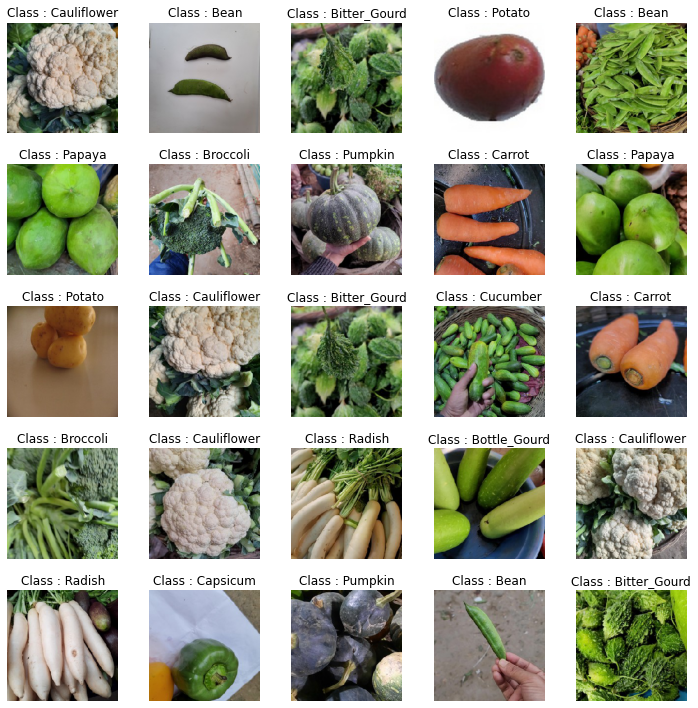

In [86]:
show_images()

# Model Vege Destroyer

In [116]:
model1 = Sequential([
      Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape),
      MaxPooling2D(pool_size=(2, 2)),
      Dropout(0.25),

      Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=input_shape),
      MaxPooling2D(pool_size=(2, 2)),
      Dropout(0.25),

      Flatten(),

      Dense(128, activation='relu'),
      Dense(64, activation='relu'),
      Dense(32, activation='relu'),
      Dense(n_classes, activation='softmax')
      ])

In [117]:
model1.compile(optimizer = 'adam',
              loss = 'sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [118]:
name ='vegetable_destroyer'

In [119]:
cbs = [EarlyStopping(patience=3, restore_best_weights=True), ModelCheckpoint(name + ".h5", save_best_only=True)]

In [120]:
hist_1 = model1.fit(
      train_gen,
      validation_data = validation_gen,
      callbacks = cbs,
      epochs = 25)

Epoch 1/25
469/469 [==============================] - 1067s 2s/step - loss: 1.3600 - accuracy: 0.5563 - val_loss: 0.8165 - val_accuracy: 0.7267
Epoch 2/25
469/469 [==============================] - 1041s 2s/step - loss: 0.4443 - accuracy: 0.8618 - val_loss: 0.5922 - val_accuracy: 0.8070
Epoch 3/25
469/469 [==============================] - 1050s 2s/step - loss: 0.2245 - accuracy: 0.9308 - val_loss: 0.4126 - val_accuracy: 0.8763
Epoch 4/25
469/469 [==============================] - 1059s 2s/step - loss: 0.1136 - accuracy: 0.9656 - val_loss: 0.2893 - val_accuracy: 0.9163
Epoch 5/25
469/469 [==============================] - 1027s 2s/step - loss: 0.1088 - accuracy: 0.9663 - val_loss: 0.2978 - val_accuracy: 0.9233
Epoch 6/25
469/469 [==============================] - 1012s 2s/step - loss: 0.0633 - accuracy: 0.9797 - val_loss: 0.3756 - val_accuracy: 0.8993
Epoch 7/25
469/469 [==============================] - 1025s 2s/step - loss: 0.0647 - accuracy: 0.9789 - val_loss: 0.3240 - val_accuracy:

In [121]:
model1.evaluate(test_gen)

94/94 [==============================] - 51s 540ms/step - loss: 0.3050 - accuracy: 0.9213


[0.30495887994766235, 0.9213333129882812]

In [123]:
def plot_accuracy_and_loss(train_model):
    hist = train_model.history
    acc = hist['accuracy']
    val_acc = hist['val_accuracy']
    loss = hist['loss']
    val_loss = hist['val_loss']
    epochs = range(len(acc))
    f, ax = plt.subplots(1,2, figsize=(14,6))
    ax[0].plot(epochs, acc, 'g', label='Training accuracy')
    ax[0].plot(epochs, val_acc, 'r', label='Validation accuracy')
    ax[0].set_title('Training and validation accuracy')
    ax[0].set(xlabel='Epoch', ylabel='Accuracy')
    ax[0].legend()
    ax[1].plot(epochs, loss, 'g', label='Training loss')
    ax[1].plot(epochs, val_loss, 'r', label='Validation loss')
    ax[1].set_title('Training and validation loss')
    ax[1].set(xlabel='Epoch', ylabel='Accuracy')
    ax[1].legend()
    plt.show()

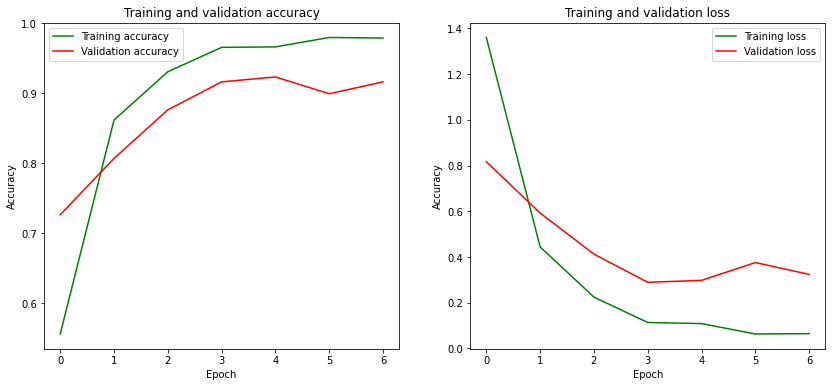

In [124]:
plot_accuracy_and_loss(hist_1)

1/1 [==============================] - 0s 45ms/step


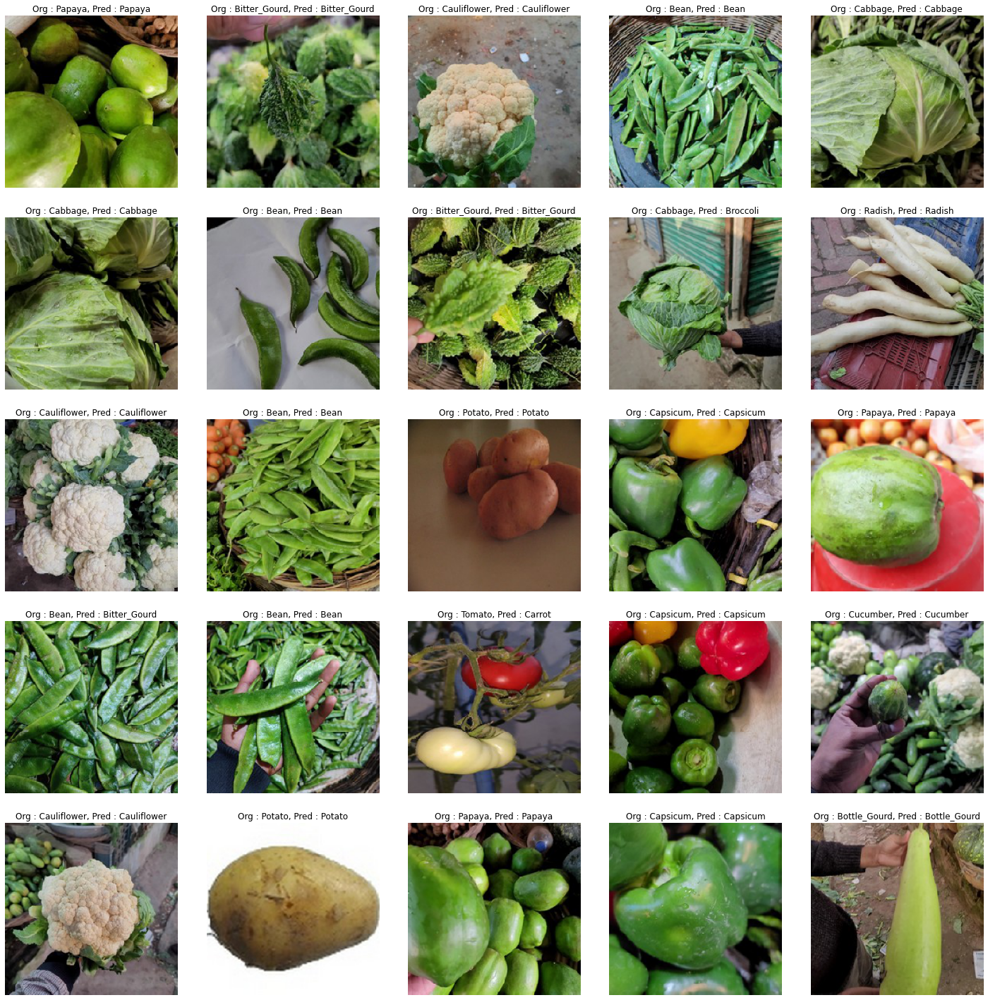

In [130]:
show_images(model=model1, data=test_gen)

# Model Load

In [131]:
# Specify Model Path
model_path = '/content/vegetable_destroyer.h5'
model = load_model(model_path)

# Architecture
model.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_34 (Conv2D)          (None, 198, 198, 32)      896       
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 99, 99, 32)       0         
 g2D)                                                            
                                                                 
 dropout_12 (Dropout)        (None, 99, 99, 32)        0         
                                                                 
 conv2d_35 (Conv2D)          (None, 97, 97, 64)        18496     
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 48, 48, 64)       0         
 g2D)                                                            
                                                                 
 dropout_13 (Dropout)        (None, 48, 48, 64)      

In [132]:
model.evaluate(test_gen)

94/94 [==============================] - 61s 649ms/step - loss: 0.3050 - accuracy: 0.9213


[0.3049587905406952, 0.9213333129882812]

1/1 [==============================] - 0s 76ms/step


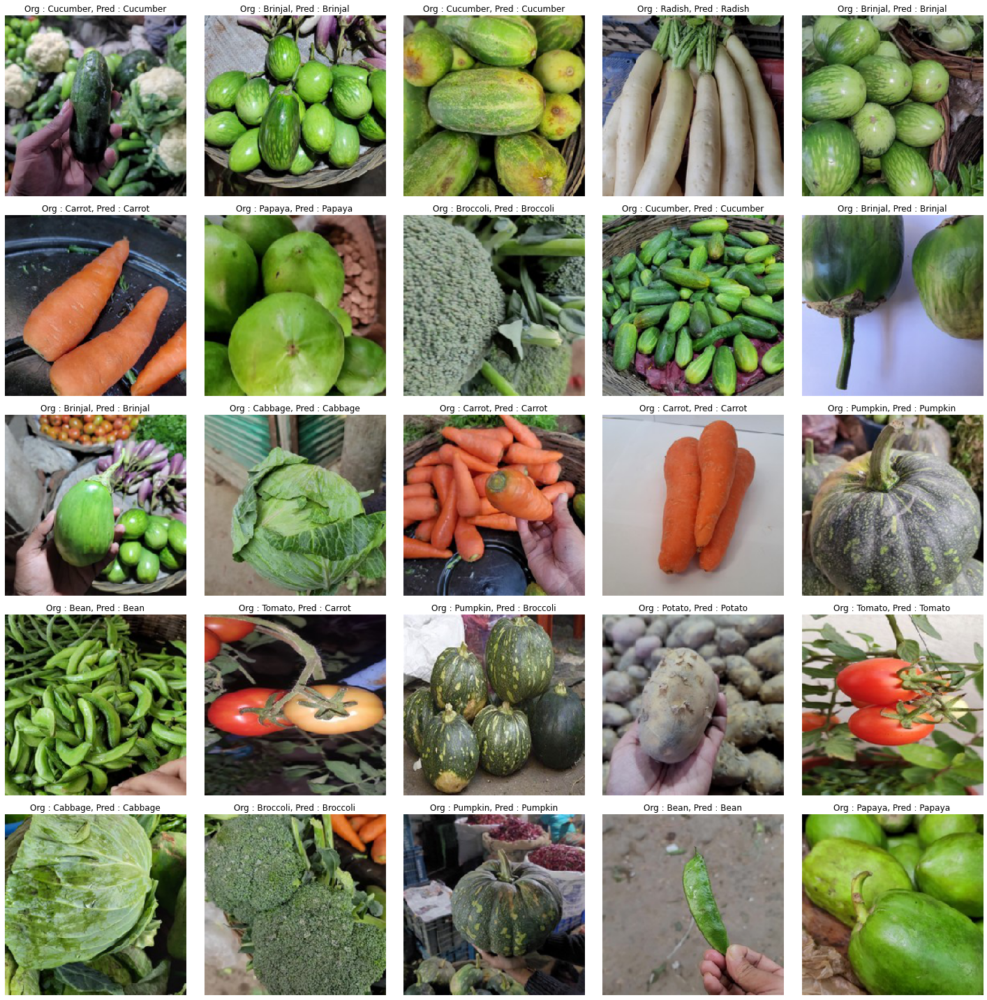

In [133]:
# Visualize Predictions
show_images(model=model, data=test_gen)

# Model acc 99

In [136]:
# Specify Model Path
model_path = "/content/ResNet50V2- Vegetable-Classifier.h5"
model_v = load_model(model_path)

# Architecture
model_v.summary()

Model: "ResNet50V2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 8, 8, 2048)        23564800  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 256)               524544    
                                                                 
 dense_1 (Dense)             (None, 15)                3855      
                                                                 
Total params: 24,093,199
Trainable params: 528,399
Non-trainable params: 23,564,800
_________________________________________________________________


In [137]:
# Evaluation on test Set
model_v.evaluate(test_gen)

94/94 [==============================] - 383s 4s/step - loss: 0.0283 - accuracy: 0.9913


[0.02829495444893837, 0.9913333058357239]

In [144]:
test_datagen2 = ImageDataGenerator(rescale=1/255.)
test_gen2 = test_datagen.flow_from_directory(
    root_path.replace('train', 'test'), 
    class_mode='binary', 
    target_size=(256,256), 
    shuffle=True, 
    batch_size=32)

Found 3000 images belonging to 15 classes.


1/1 [==============================] - 0s 233ms/step


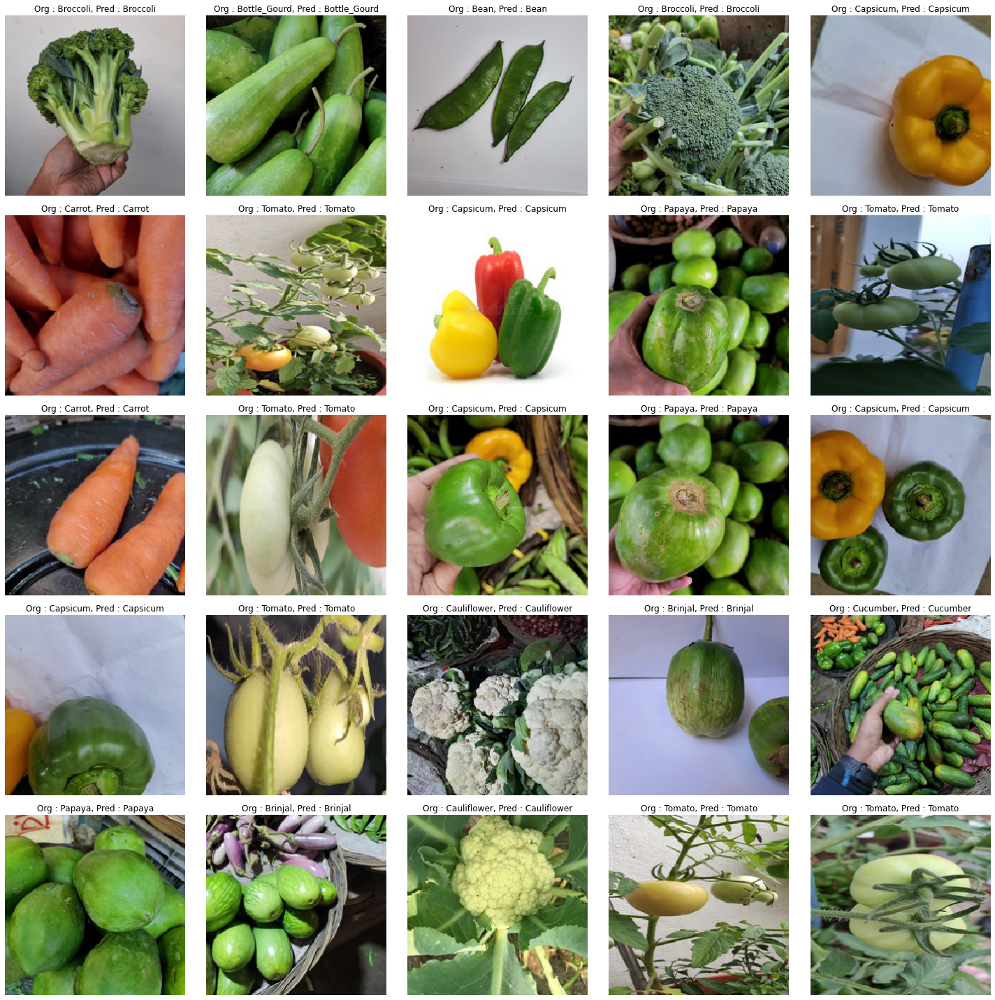

In [145]:
# Visualize Predictions
show_images(model=model_v, data=test_gen2)

In [125]:
import shutil

In [126]:
# file_to = '/content/Vegatable CNN'
# file_format = 'zip'
# file_from = '/content/'
# shutil.make_archive(file_to, file_format, file_from)

'/content.zip'

In [139]:
files.download('/content/Vegetable CNN destroyer.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Reference
- Download Kaggle : https://www.kaggle.com/general/74235#1376561
- Vegetable Datasets:
  * https://www.researchgate.net/publication/352846889_DCNN-Based_Vegetable_Image_Classification_Using_Transfer_Learning_A_Comparative_Study
  * https://www.kaggle.com/datasets/misrakahmed/vegetable-image-dataset
- Vegetable acc 99 : https://www.kaggle.com/code/utkarshsaxenadn/vegetable-classification-resnet50v2-acc-99/notebook
- Download G. Colab : 
  * https://pangpuriye.superai.me/google-colab-zip-and-unzip-file/
  * https://predictivehacks.com/?all-tips=how-to-download-files-and-folders-from-colab 
